# Simulation using Concord

In [1]:
%load_ext autoreload
%autoreload 2

In [4]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [5]:
proj_name = "simulation_oneloop_gap"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/{proj_name}/"
data_dir = Path(data_dir)
data_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cpu


'Feb08-1145'

In [6]:
state_key = 'time'
batch_key = 'batch'
state_type = 'trajectory'
batch_type = 'batch_specific_features'
distribution = 'normal'
leiden_key = 'leiden_no_noise'

In [21]:
from Concord.utils.simulation import Simulation

# Create an instance of the Simulation class

sim = Simulation(n_cells=1000, n_genes=100, n_batches=2, n_states=3, 
                 state_type=state_type, 
                 state_distribution = distribution, 
                 state_level=10, 
                 state_min_level=0,
                 state_dispersion=4.0, 
                 program_structure='linear_bidirectional',
                 program_on_time_fraction=0.0,
                 trajectory_program_num=4,
                 trajectory_cell_block_size_ratio=0.5,
                 trajectory_loop_to=[0],
                 batch_distribution = distribution,
                 batch_type=batch_type, 
                 batch_level=[10,10], 
                 batch_dispersion=[2.0, 2.0], 
                 non_neg=True, to_int=True,
                 seed=42)

# Generate the simulated data
adata_state = sim.simulate_state()
adata_state = adata_state[:, ccd.ul.sort_string_list(adata_state.var_names)]
adata_state.shape

Concord.utils.simulation - INFO - Simulating trajectory with 3 states, distribution: normal with mean expression 10 and dispersion 4.0.


(1000, 100)

In [24]:
(adata_state.obs['time'] >= 600).sum()

400

In [26]:
# Define cell indices for each batch, with partial overlap
batch1_time = (adata_state.obs['time'] < 500) & (adata_state.obs['time'] >= 100) 
batch2_time = (adata_state.obs['time'] >= 600)
batch1_idx = np.where(batch1_time)[0]
batch2_idx = np.where(batch2_time)[0]

batch_indices = {0: batch1_idx, 1: batch2_idx}

In [27]:
from scipy import sparse as sp
import anndata as ad

batch_list = []
state_list = []
for i in range(sim.n_batches):
    batch_adata, batch_adata_pre = sim.simulate_batch(
        adata_state, 
        cell_proportion=sim.batch_cell_proportion[i], 
        cell_indices=batch_indices[i],
        batch_name=f"batch_{i+1}", effect_type=sim.batch_type[i], 
        distribution = sim.batch_distribution[i],
        level=sim.batch_level[i], dispersion=sim.batch_dispersion[i], 
        batch_feature_frac=sim.batch_feature_frac[i], seed=sim.seed+i)
    batch_list.append(batch_adata)
    state_list.append(batch_adata_pre)

adata = ad.concat(batch_list, join='outer')
adata.X = adata.X.toarray() if sp.issparse(adata.X) else adata.X
adata.X = np.nan_to_num(adata.X, nan=0.0)

adata = adata[:, ccd.ul.sort_string_list(adata.var_names)]

adata_pre = ad.concat(state_list, join='outer')
adata_pre = adata_pre[:, ccd.ul.sort_string_list(adata_pre.var_names)]

# Concatenate batch name to cell names to make them unique
adata.obs_names = [f"{batch}_{cell}" for batch, cell in zip(adata.obs['batch'], adata.obs_names)]
adata_pre.obs_names = [f"{batch}_{cell}" for batch, cell in zip(adata_pre.obs['batch'], adata_pre.obs_names)]

adata.obs['batch'] = adata.obs['batch'].astype('category')
adata_pre.obs['batch'] = adata_pre.obs['batch'].astype('category')

if sim.non_neg:
    adata.X[adata.X < 0] = 0
    adata_pre.X[adata_pre.X < 0] = 0
if sim.to_int:
    adata.X = adata.X.astype(int)
    adata_pre.X = adata_pre.X.astype(int)

adata.layers['wt_noise'] = adata.X 
adata_pre.layers['wt_noise'] = adata_pre.X
adata.layers['counts'] = adata.X.copy()

adata_state = adata_pre


Concord.utils.simulation - INFO - Simulating batch-specific features effect on batch_1 by appending a set of batch-specific genes with normal distributed value with level 10 and dispersion 2.0.
Concord.utils.simulation - INFO - Simulating batch-specific features effect on batch_2 by appending a set of batch-specific genes with normal distributed value with level 10 and dispersion 2.0.


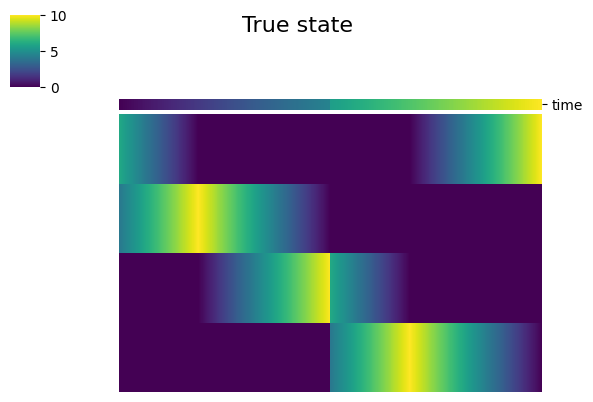

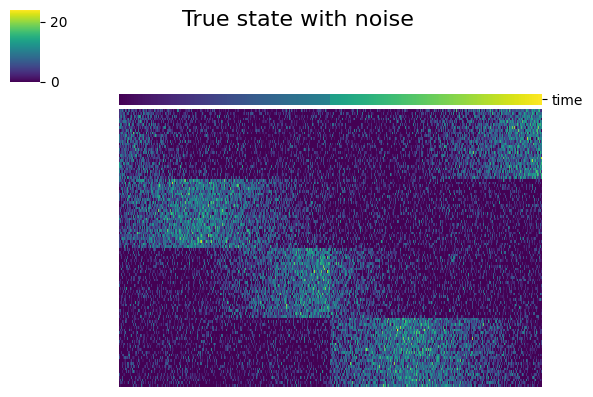

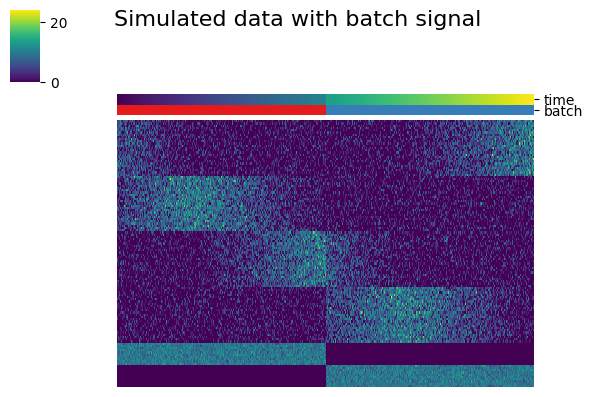

In [28]:
ccd.pl.heatmap_with_annotations(adata_state, val='no_noise', obs_keys=[state_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='True state', save_path=save_dir/f'true_state_heatmap_{file_suffix}.svg', figsize=(6, 4), dpi=300)
ccd.pl.heatmap_with_annotations(adata_state, val='wt_noise', obs_keys=[state_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='True state with noise', save_path=save_dir/f'true_state_with_noise_heatmap_{file_suffix}.svg', figsize=(6, 4), dpi=300)
ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Simulated data with batch signal', save_path=save_dir/f'simulated_data_heatmap_{file_suffix}.svg', figsize=(6, 4), dpi=300)

### No batch effect, no noise

In [29]:
ccd.ul.run_pca(adata_state, source_key='no_noise', result_key='PCA_no_noise', n_pc=30, random_state=seed)
ccd.ul.run_umap(adata_state, source_key='PCA_no_noise', result_key='UMAP_no_noise', random_state=seed)

Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_no_noise']
Concord - INFO - UMAP embedding stored in adata.obsm['UMAP_no_noise']


In [30]:
sc.pp.neighbors(adata_state, use_rep='PCA_no_noise', n_neighbors=30, random_state=seed)
sc.tl.leiden(adata_state, resolution=1.0, key_added=leiden_key, random_state=seed)
adata.obs[leiden_key] = adata_state.obs[leiden_key]

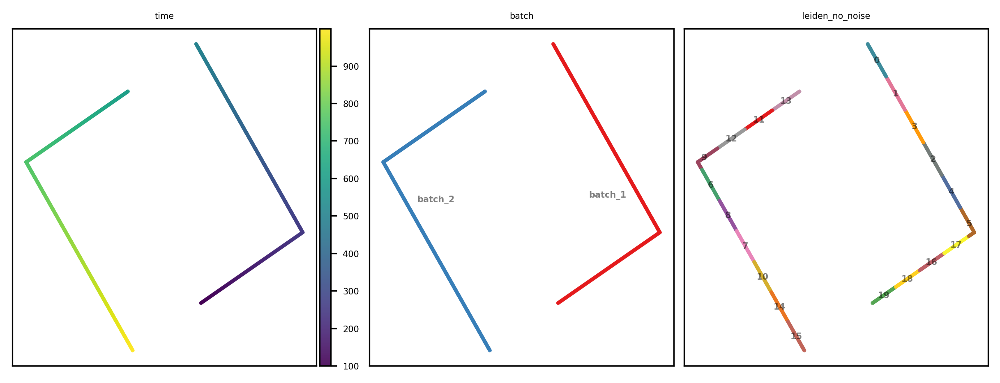

In [31]:
show_basis = 'PCA_no_noise'
show_cols = [state_key, batch_key, leiden_key]

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.svg"
)

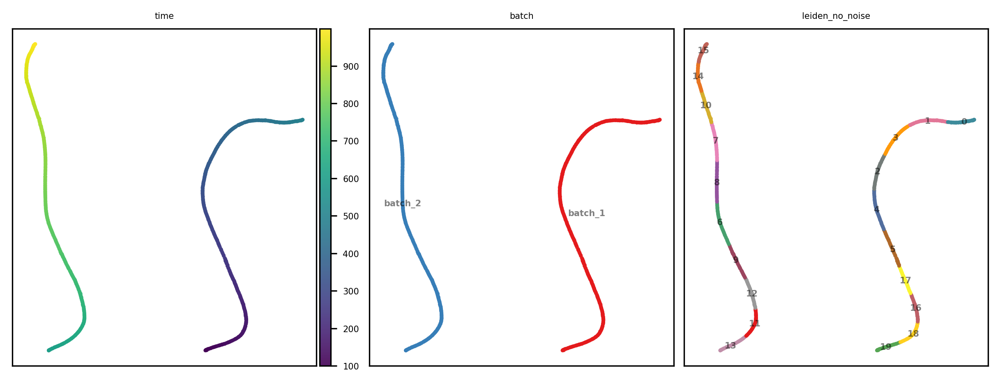

In [32]:
show_basis = 'UMAP_no_noise'

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.svg"
)

### NO batch effect, noise added, PCA and UMAP

In [33]:
adata_state.X = adata_state.layers['wt_noise'].copy()
ccd.ul.run_pca(adata_state, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=30, random_state=seed)
ccd.ul.run_umap(adata_state, source_key='PCA_wt_noise', result_key='UMAP_wt_noise', random_state=seed)

Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_wt_noise']
Concord - INFO - UMAP embedding stored in adata.obsm['UMAP_wt_noise']


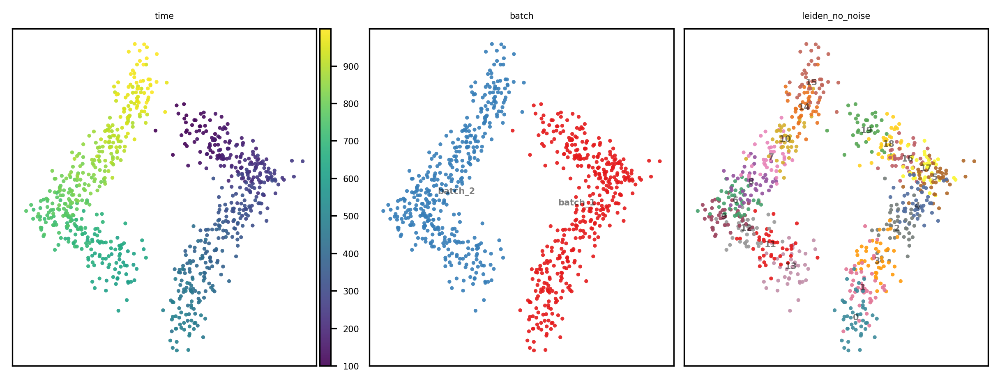

In [34]:
show_basis = 'PCA_wt_noise'
show_cols = [state_key, batch_key, leiden_key]

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.svg"
)

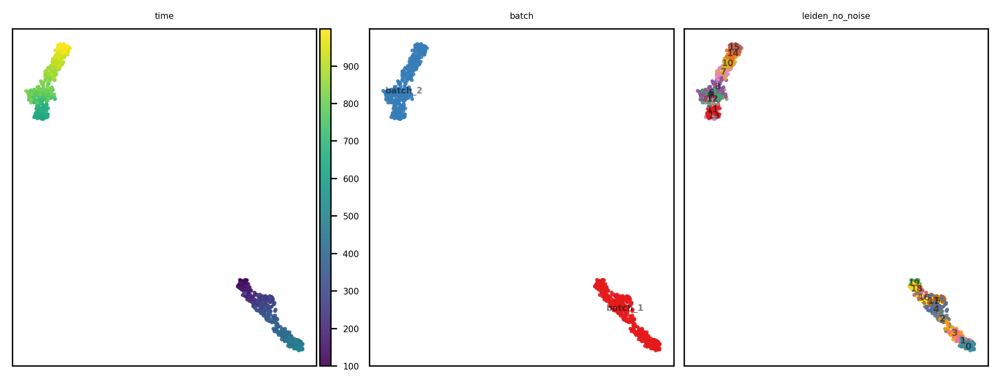

In [35]:
show_basis = 'UMAP_wt_noise'

ccd.pl.plot_embedding(
    adata_state, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"nobatch_{show_basis}_{file_suffix}.png"
)

### No batch correction, PCA and UMAP

In [36]:
n_pcs = min(adata.n_obs, adata.n_vars)-1
sc.pp.pca(adata, n_comps=n_pcs)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=n_pcs)
sc.tl.umap(adata, min_dist=0.5)
adata.obsm["Unintegrated"] = adata.obsm["X_pca"]

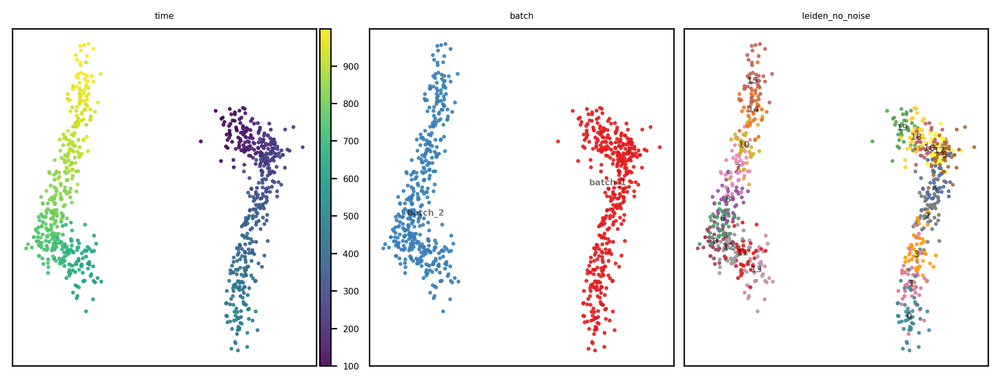

In [37]:
show_basis = 'X_pca'
show_cols = [state_key, batch_key, leiden_key]

ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

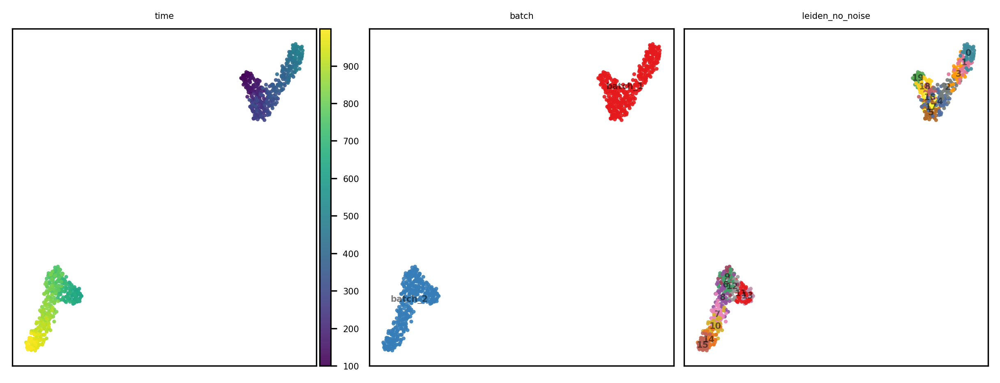

In [38]:
show_basis = 'X_umap'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=20, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

# Run other methods

In [39]:
file_suffix = f"{time.strftime('%b%d-%H%M')}"
ccd.set_verbose_mode(True)
show_cols = [state_key, batch_key]
timer = ccd.ul.Timer()
time_log = {}

### Scanorama

In [40]:
output_key = 'Scanorama'

with timer:
    ccd.ul.run_scanorama(adata, batch_key="batch", output_key=output_key, return_corrected=True)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

Found 120 genes among all datasets
[[0.    0.475]
 [0.    0.   ]]
Processing datasets (0, 1)
Found 120 genes among all datasets
[[0.    0.475]
 [0.    0.   ]]
Processing datasets (0, 1)


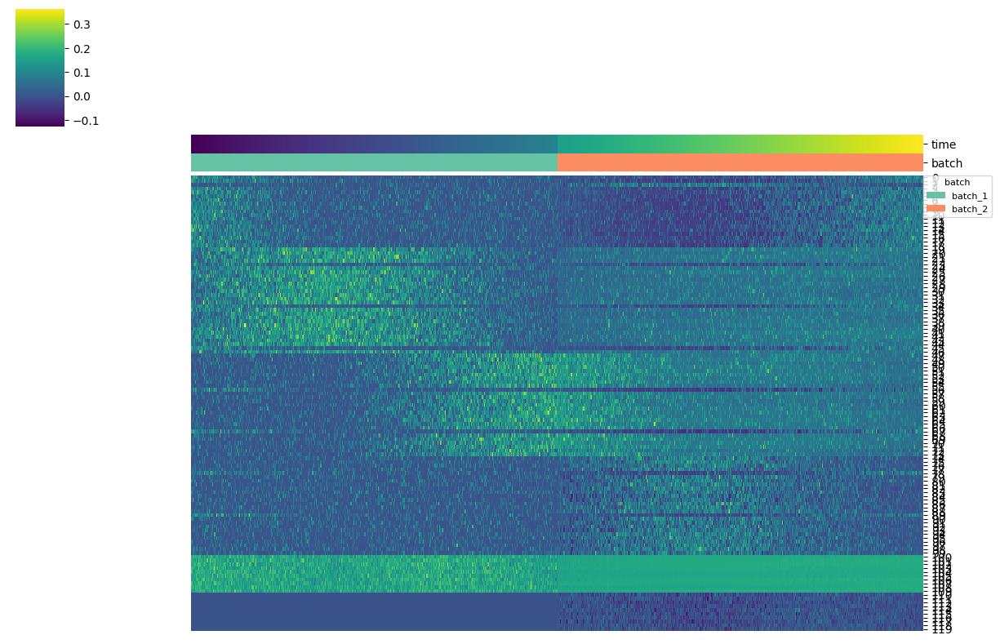

In [41]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['Scanorama_UMAP']


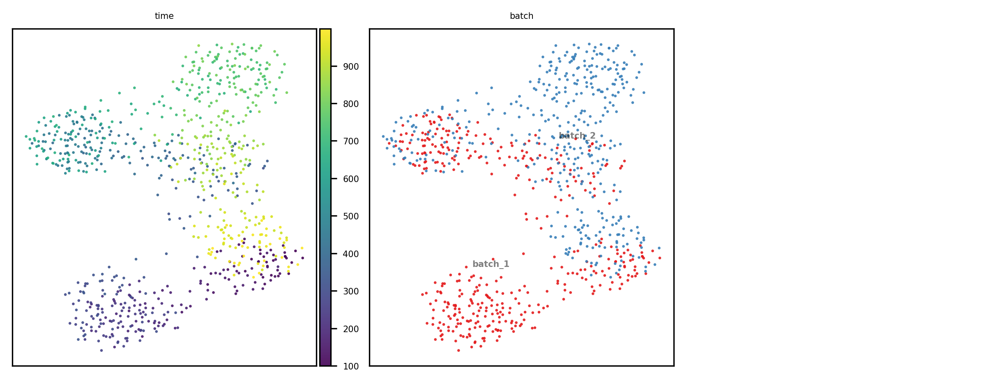

In [42]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Liger

In [43]:
output_key = 'Liger'
adata.layers["counts"] = adata.X.copy()
with timer:
    ccd.ul.run_liger(adata, batch_key="batch", count_layer="counts", output_key=output_key, k=30, return_corrected=True)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

100%|██████████| 30/30 [00:04<00:00,  7.13it/s]


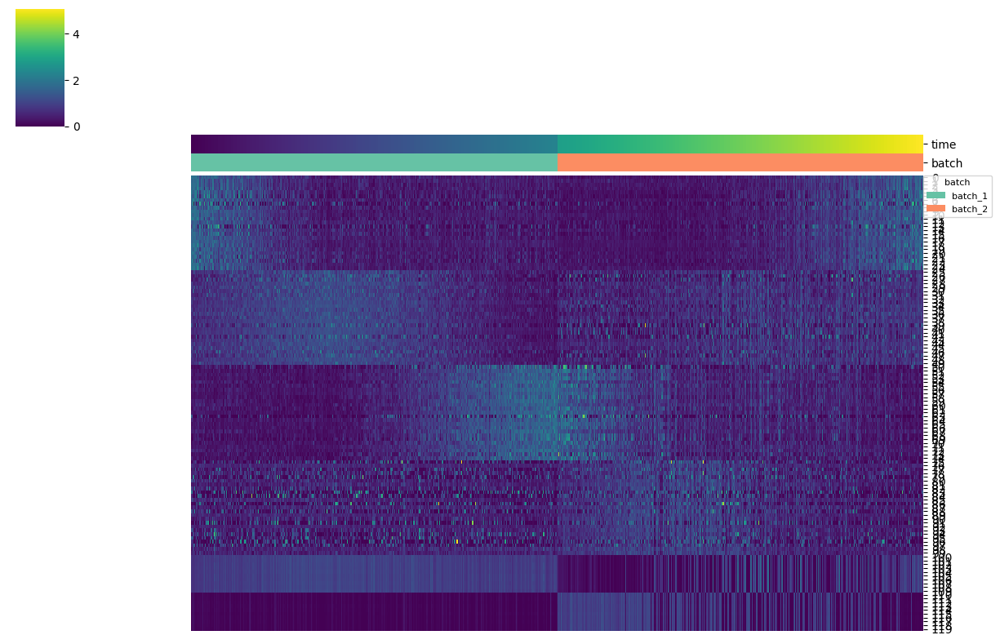

In [44]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['Liger_UMAP']


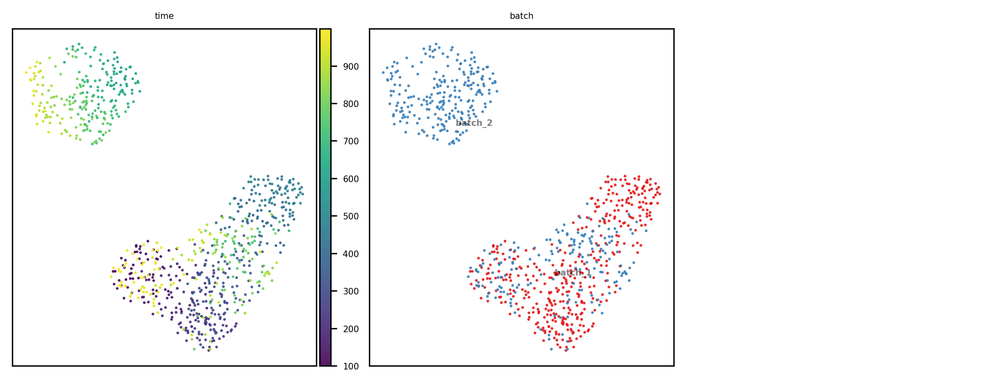

In [45]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Harmony

In [46]:
output_key = 'Harmony'
with timer:
    ccd.ul.run_harmony(adata, batch_key="batch", input_key='X_pca', output_key=output_key)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).


Concord - INFO - UMAP embedding stored in adata.obsm['Harmony_UMAP']


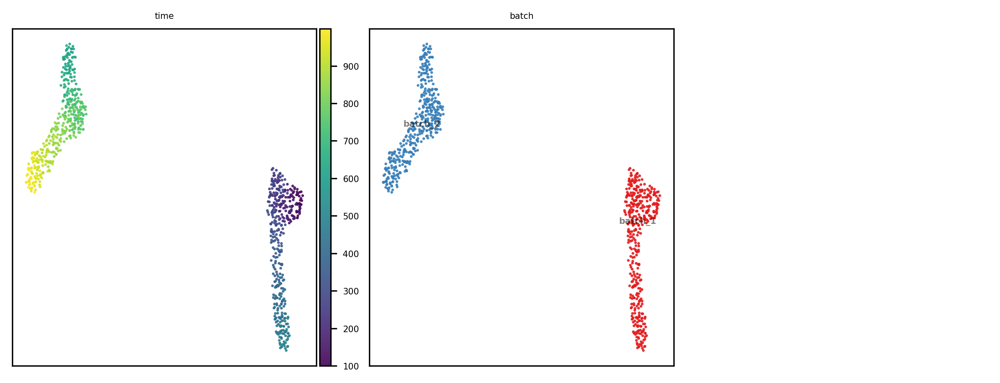

In [47]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### scVI

In [48]:
output_key = 'scVI'
transform_batch = 'batch_1'
with timer:
    scvi_vae = ccd.ul.run_scvi(adata, batch_key="batch", output_key=output_key, return_model=True, return_corrected=True, transform_batch=transform_batch)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 400/400: 100%|██████████| 400/400 [00:36<00:00, 11.48it/s, v_num=1, train_loss_step=235, train_loss_epoch=231]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:36<00:00, 11.05it/s, v_num=1, train_loss_step=235, train_loss_epoch=231]


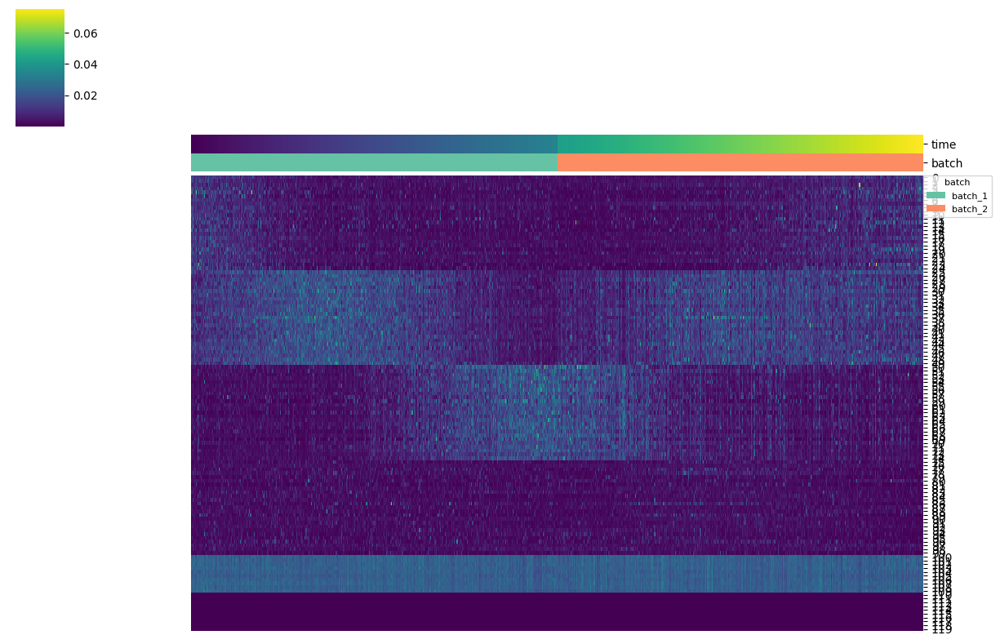

In [49]:
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected_{transform_batch}', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_{transform_batch}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['scVI_UMAP']


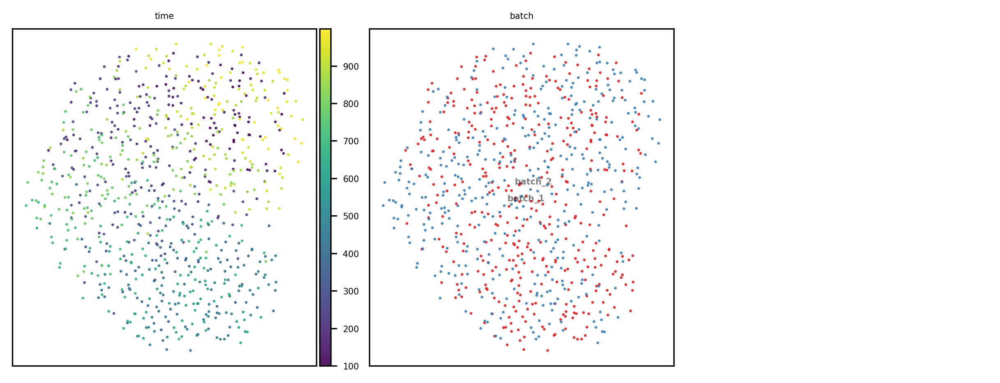

In [50]:
output_key = 'scVI'
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### scANVI

In [51]:
output_key = 'scANVI'
with timer:
    ccd.ul.run_scanvi(adata, batch_key="batch", labels_key=leiden_key, output_key=output_key, scvi_model=scvi_vae, return_corrected=True, transform_batch=transform_batch)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

INFO     Training for 20 epochs.                                                                                   


Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 20/20: 100%|██████████| 20/20 [00:05<00:00,  4.90it/s, v_num=1, train_loss_step=259, train_loss_epoch=259]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:05<00:00,  3.98it/s, v_num=1, train_loss_step=259, train_loss_epoch=259]


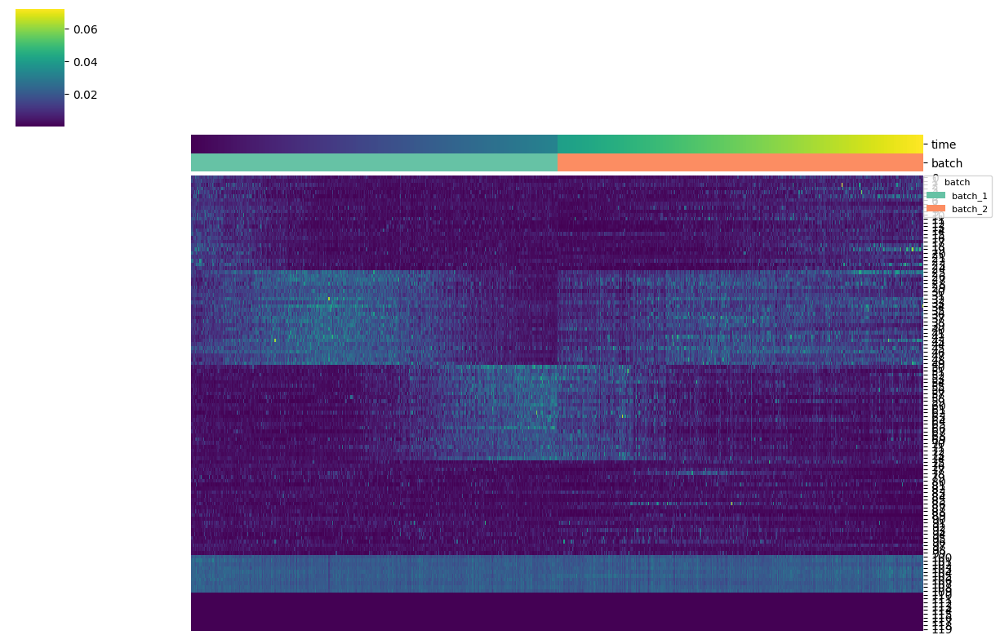

In [52]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected_{transform_batch}', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_{transform_batch}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['scANVI_UMAP']


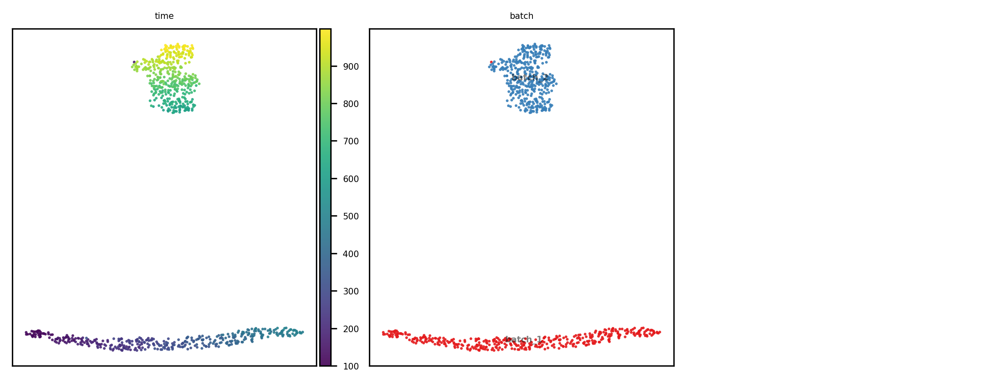

In [53]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Concord

In [54]:
concord_args = {
    'adata': adata,
    'input_feature': None, 
    'min_p_intra_domain': 0.9,
    'n_epochs': 15,
    'domain_key': 'batch',
    'seed': seed, # random seed
    'verbose': False, # print training progress
    'device': device, # device to run on
    'save_dir': save_dir # directory to save model checkpoints
}


In [55]:
cur_ccd = ccd.Concord( use_decoder=False, **concord_args)

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord'
with timer:
    cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)

time_log[output_key] = timer.interval
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 800 points to 28 centroids: please provide at least 1092 training points


p_intra_knn: 0.3


Epoch 0 Training: 12it [00:00, 27.59it/s, loss=4.39]
Epoch 14 Training: 100%|██████████| 12/12 [00:00<00:00, 101.39it/s, loss=4.03]


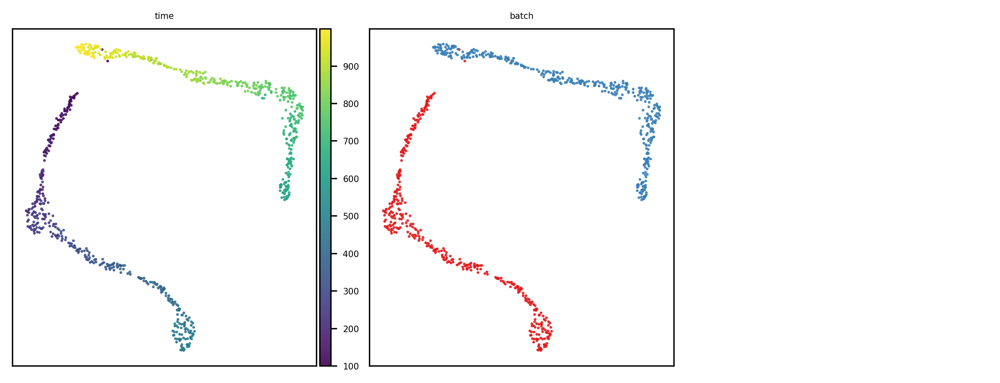

In [56]:
output_key = 'Concord'
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc=None,
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

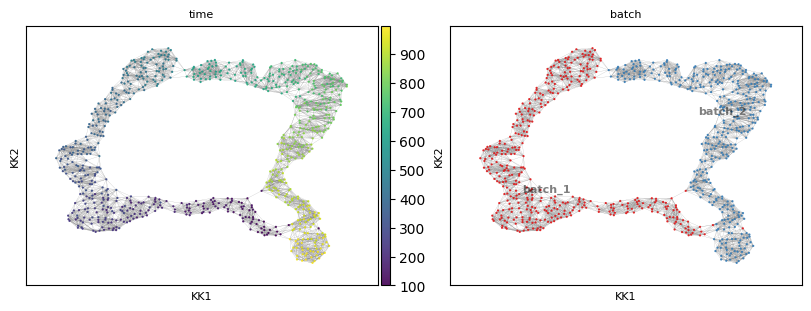

In [57]:
ccd.pl.plot_graph(adata, basis=output_key, color_by = show_cols, edges=True, k=15, ncols=2, figsize=(8,3), dpi=100)

### Concord with decoder

In [58]:
decoder_ccd = ccd.Concord(use_decoder=True, **concord_args)

output_key = 'Concord-decoder'
with timer:
    decoder_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)

time_log[output_key] = timer.interval
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(decoder_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 800 points to 28 centroids: please provide at least 1092 training points


p_intra_knn: 0.3


Epoch 0 Training: 12it [00:00, 60.42it/s, loss=16.5]
Epoch 14 Training: 100%|██████████| 12/12 [00:00<00:00, 84.78it/s, loss=11.6]


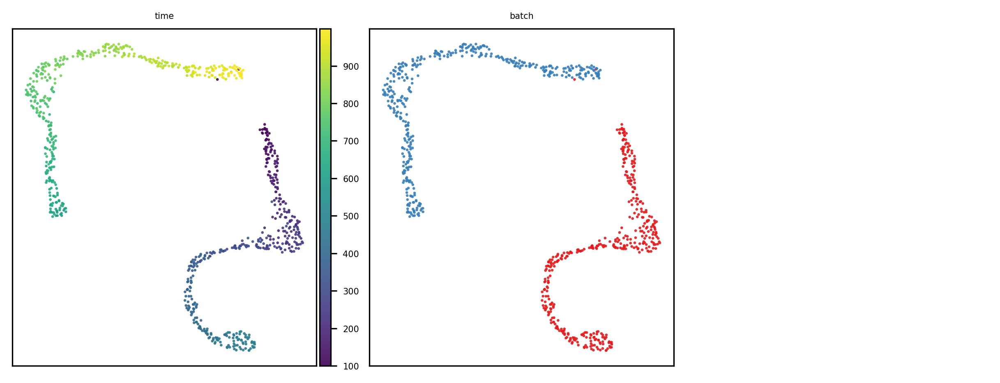

In [59]:
output_key = 'Concord-decoder'
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc=None,
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [60]:
# Predict and store the results
decoder_domains = adata.obs[batch_key].unique()
for domain in decoder_domains:
    _, decoded, _, _, _, _ = decoder_ccd.predict(decoder_ccd.loader, return_decoded=True, decoder_domain=domain, return_class=True, return_class_prob=True)
    save_key = f"{output_key}_decoded_{domain}"
    adata.layers[save_key] = decoded

adata.layers

Layers with keys: wt_noise, counts, Scanorama_corrected, Liger_corrected, scVI_corrected_batch_1, scANVI_corrected_batch_1, Concord-decoder_decoded_batch_1, Concord-decoder_decoded_batch_2

### Concord with classifier

In [61]:
cur_ccd = ccd.Concord(use_classifier=True, # use classifier
                      class_key = leiden_key, # key indicating cell type
                      train_frac=1.0, # fraction of data to use for training
                      **concord_args
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
file_suffix = f"{proj_name}_{time.strftime('%b%d-%H%M')}"
output_key = 'Concord-class'
with timer:
    cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)

time_log[output_key] = timer.interval
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 800 points to 28 centroids: please provide at least 1092 training points


p_intra_knn: 0.3


Epoch 0 Training: 12it [00:00, 53.70it/s, loss=7.04]
Epoch 14 Training: 100%|██████████| 12/12 [00:00<00:00, 80.92it/s, loss=5.57]


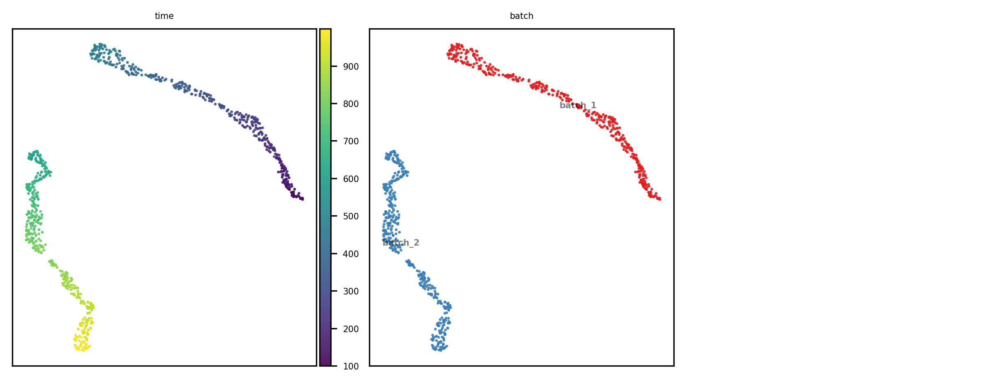

In [62]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [ ]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      domain_key=None, # key indicating batch
                      min_p_intra_domain=None, # probability of sampling intra-domain pairs
                      seed=seed, # random seed
                      verbose=True, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord_nd'
cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)


In [63]:
adata.obsm['Unintegrated'] = adata.obsm['X_pca']
n_pc=30
ccd.ul.run_pca(adata_state, source_key='no_noise', result_key='PCA_no_noise', n_pc=n_pc, random_state=seed)
ccd.ul.run_pca(adata_state, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=n_pc, random_state=seed)

# Put the PCA result in the adata object, so only one object is needed
adata.obsm['PCA_no_noise'] = adata_state.obsm['PCA_no_noise']
adata.obsm['PCA_wt_noise'] = adata_state.obsm['PCA_wt_noise']
adata.obsm

AxisArrays with keys: X_pca, X_umap, Unintegrated, Scanorama, Scanorama_UMAP, Liger, Liger_UMAP, Harmony, Harmony_UMAP, scVI, scVI_UMAP, scANVI, scANVI_UMAP, Concord, Concord_UMAP, X_draw_graph_kk, Concord-decoder, Concord-decoder_UMAP, Concord-class, Concord-class_UMAP, PCA_no_noise, PCA_wt_noise

In [9]:
latent_keys = ["Unintegrated", "Scanorama", "Liger", "Harmony", "scVI","Concord_nd", "Concord", 'Concord-decoder', "Concord-class",  "scANVI"]
ground_keys = ['PCA_no_noise', 'PCA_wt_noise']
combined_keys = ground_keys + latent_keys 

In [65]:
# Run umap and PCA for all latent embeddings
for basis in combined_keys:
    print("Running UMAP and PCA for", basis)
    if basis not in adata.obsm:
        continue
    #if 'UMAP' not in basis:
    ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
    if 'PCA' not in basis:
        n_pc = min(adata.obsm[basis].shape[1], adata.shape[0]) - 1
        ccd.ul.run_pca(adata, source_key=basis, result_key=f'{basis}_PCA', n_pc=n_pc, random_state=seed)


Running UMAP and PCA for PCA_no_noise
Running UMAP and PCA for PCA_wt_noise
Running UMAP and PCA for Unintegrated
Running UMAP and PCA for Scanorama
Running UMAP and PCA for Liger
Running UMAP and PCA for Harmony
Running UMAP and PCA for scVI
Running UMAP and PCA for scANVI
Running UMAP and PCA for Concord
Running UMAP and PCA for Concord-decoder
Running UMAP and PCA for Concord-class


Concord.plotting.pl_embedding - INFO - Plotting PCA_no_noise with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting PCA_wt_noise with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Unintegrated with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Scanorama with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Liger with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Harmony with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting scVI with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord_nd with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord-decoder with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord-class with time in KNN
Concord.plotting.pl_embedding - INFO - Plotting scANVI with time in KNN


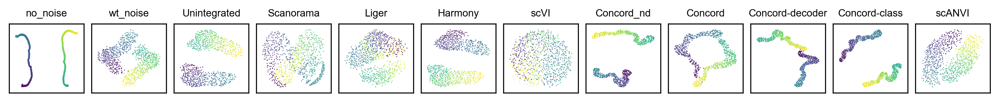

Concord.plotting.pl_embedding - INFO - Plotting PCA_no_noise with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting PCA_wt_noise with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Unintegrated with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Scanorama with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Liger with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Harmony with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting scVI with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord_nd with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord-decoder with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting Concord-class with batch in KNN
Concord.plotting.pl_embedding - INFO - Plotting scANVI with batch in KNN


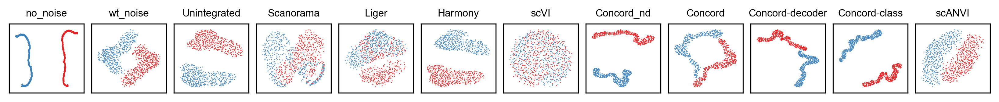

In [12]:
# plot everything
import matplotlib.pyplot as plt
import pandas as pd


# from matplotlib import font_manager, rcParams

# # Add custom font path
# font_dirs = ['/wynton/home/gartner/zhuqin/.conda/envs/cellpath/fonts']  # Your custom fonts directory
# font_files = font_manager.findSystemFonts(fontpaths=font_dirs)

# # Create FontProperties for each custom font and add to the font manager
# for font_path in font_files:
#     font_manager.fontManager.addfont(font_path)

# Set Arial as the default font
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

color_bys = ['time', 'batch']
#basis_types = ['KNN', 'UMAP']
#basis_types = ['PCA']
basis_types = ['KNN']
font_size=8
point_size=2.5
alpha=0.8
figsize=(0.9*len(combined_keys),1)
ncols = len(combined_keys)
nrows = int(np.ceil(len(combined_keys) / ncols))
pal = {'time':'viridis', 'batch':'Set1'}
k=15
edges_color='grey'
edges_width=0.0
layout='kk'
threshold = 0.1
node_size_scale=0.1
edge_width_scale=0.1

rasterized = True
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        combined_keys,
        color_bys=color_bys,
        basis_types=basis_types,
        pal=pal,
        k=k,
        edges_color=edges_color,
        edges_width=edges_width,
        layout=layout,
        threshold=threshold,
        node_size_scale=node_size_scale,
        edge_width_scale=edge_width_scale,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        rasterized=rasterized,
        figsize=figsize,
        ncols=ncols,
        seed=2025,
        leiden_key='leiden',
        save_dir=save_dir,
        file_suffix=file_suffix+f'rasterized_{rasterized}',
        save_format='svg'
    )


In [67]:
adata.layers['no_noise'] = np.zeros_like(adata.X)
adata.layers['wt_noise'] = np.zeros_like(adata.X)
# Find the indices of common genes between `adata` and `adata_state`
common_genes = adata.var_names.intersection(adata_state.var_names)
adata_indices = adata.var_names.get_indexer(common_genes)
adata_state_indices = adata_state.var_names.get_indexer(common_genes)

# Copy data from `adata_state` to `adata` for these common genes
adata.layers['no_noise'][:, adata_indices] = adata_state.layers['no_noise'][:, adata_state_indices].copy()
adata.layers['wt_noise'][:, adata_indices] = adata_state.layers['wt_noise'][:, adata_state_indices].copy()

# sort and smooth the signal along the path
#batch_id=adata.obs['batch'].unique()[0]
cell_order = adata.obs['time'].argsort()
_, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='Concord', path=cell_order, sigma=2)
adata.obsm['Concord_sorted'] = adata.obsm['Concord'][:, feature_order]

_, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='Concord-decoder', path=cell_order, sigma=2)
adata.obsm['Concord-decoder_sorted'] = adata.obsm['Concord-decoder'][:, feature_order]

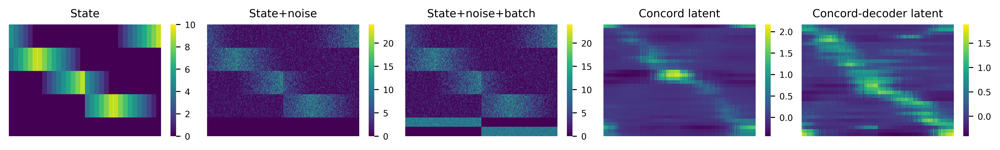

In [72]:
# Plot heatmap of original data and Concord latent
import matplotlib.pyplot as plt
figsize = (2.3, 1.8)
ncols = 5
title_fontsize = 9
dpi = 600
fig, axes = plt.subplots(1, ncols, figsize=(figsize[0] * ncols, figsize[1]), dpi=dpi)
ccd.pl.heatmap_with_annotations(adata, val='no_noise', obs_keys=[state_key], ax = axes[0], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='wt_noise', obs_keys=[state_key], ax = axes[1], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], ax = axes[2], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise+batch', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='Concord_sorted', obs_keys=[state_key, batch_key], ax = axes[3], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='Concord-decoder_sorted', obs_keys=[state_key, batch_key], ax = axes[4], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord-decoder latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
plt.tight_layout(w_pad=0.0, h_pad=0.1)
plt.savefig(save_dir / f"all_heatmaps_{file_suffix}.svg", dpi=dpi, bbox_inches='tight')

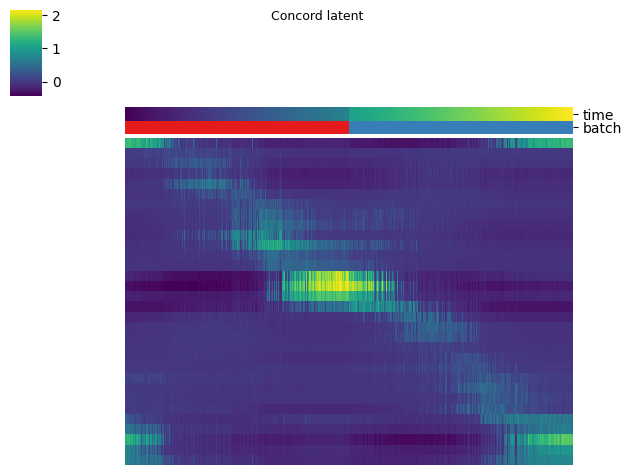

In [73]:
adata_time_sorted = adata[cell_order]
ccd.pl.heatmap_with_annotations(adata_time_sorted, val='Concord_sorted', obs_keys=[state_key, batch_key], ax = axes[3], use_clustermap=True, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord latent', save_path=f"heatmap_wt_annot_{file_suffix}.svg", figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)

In [74]:
adata.write_h5ad(data_dir / f"adata_{file_suffix}.h5ad")
adata_state.write_h5ad(data_dir / f"adata_state_{file_suffix}.h5ad")
file_suffix

'simulation_oneloop_gap_Dec12-1824'

# Evaluation

In [7]:
adata = sc.read(data_dir / f"adata_simulation_oneloop_gap_Dec12-1824.h5ad")
adata_state = sc.read(data_dir / f"adata_state_simulation_oneloop_gap_Dec12-1824.h5ad")

### Scib

In [75]:
from scib_metrics.benchmark import Benchmarker
bm = Benchmarker(
    adata,
    batch_key=batch_key,
    label_key=leiden_key,
    embedding_obsm_keys=latent_keys,
    n_jobs=6,
)
bm.benchmark()

Embeddings:   0%|          | 0/9 [00:04<?, ?it/s]


ValueError: No objects to concatenate

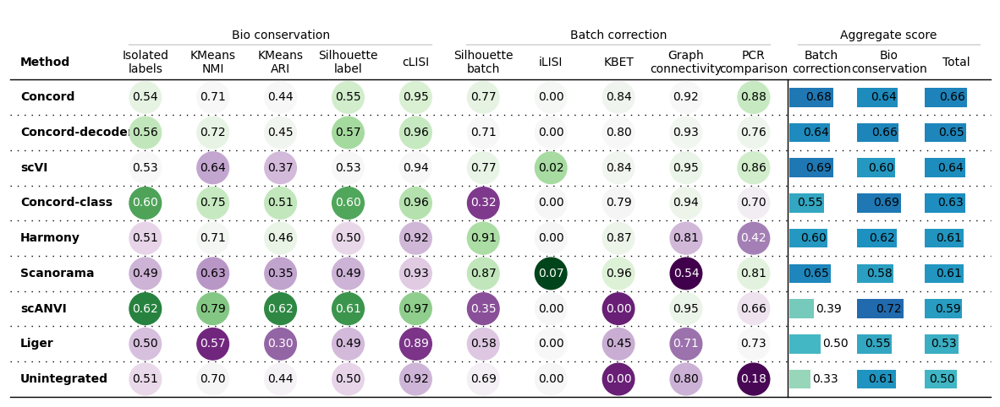

In [54]:
import matplotlib.pyplot as plt
import os
bm.plot_results_table(min_max_scale=False, show=False)
fig = plt.gcf()
fig.set_size_inches(15, 6) 
fig.savefig(os.path.join(save_dir, f'scibmetrics_results_{file_suffix}.pdf'), facecolor='white', dpi=600)
plt.show()
plt.close(fig)

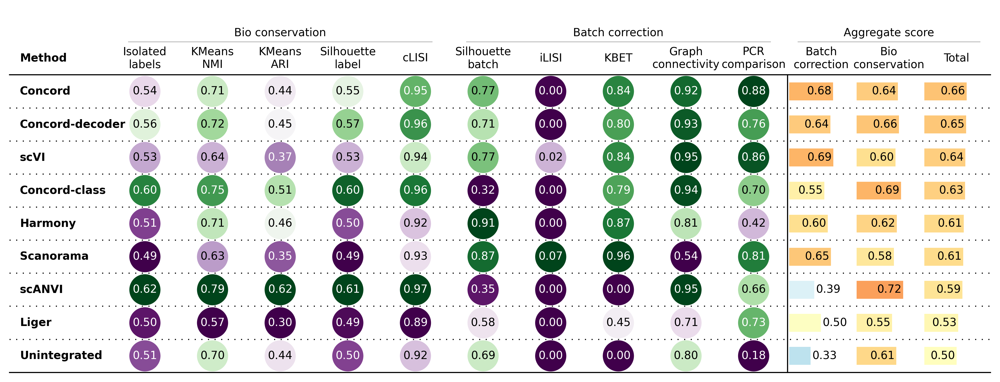

In [55]:
import pandas as pd
scib_scores = bm.get_results(min_max_scale=False)
# Convert row 'Metric Type' to multi-index column, first level is 'Metric Type', second level is existing column name
metric_type = scib_scores.loc['Metric Type']
scib_scores = scib_scores.drop('Metric Type')  # Drop the last row now that it's stored in metric_type
scib_scores.columns = pd.MultiIndex.from_tuples([(metric_type[col], col) for col in scib_scores.columns])
scib_scores = ccd.ul.benchmark_stats_to_score(scib_scores, min_max_scale=False, one_minus=False, aggregate_score=False, rank=True, rank_col=('Aggregate score', 'Total'), name_exact=False)

ccd.pl.plot_benchmark_table(scib_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', save_path=save_dir / f"scib_results_{file_suffix}.pdf", figsize=(16, 6), dpi=300)

### Topology

Run topological analysis pipeline:

In [76]:
homology_dimensions = [0,1,2]
diagrams = {}
for key in combined_keys:
    print(f"Computing persistent homology for {key}")
    diagrams[key] =  ccd.ul.compute_persistent_homology(adata, key=key, homology_dimensions=homology_dimensions)

import pickle
with open(save_dir / f"topology_diagrams_{file_suffix}.pkl", 'wb') as f:
    pickle.dump(diagrams, f)

Computing persistent homology for PCA_no_noise
Computing persistent homology for PCA_wt_noise
Computing persistent homology for Unintegrated
Computing persistent homology for Scanorama
Computing persistent homology for Liger
Computing persistent homology for Harmony
Computing persistent homology for scVI
Computing persistent homology for scANVI
Computing persistent homology for Concord
Computing persistent homology for Concord-decoder
Computing persistent homology for Concord-class


In [77]:
save_dir / f"topology_diagrams_{file_suffix}.pkl"

PosixPath('../save/dev_simulation_oneloop_gap-Dec12/topology_diagrams_simulation_oneloop_gap_Dec12-1824.pkl')

In [ ]:
import pickle
with open(Path('../save/dev_simulation_oneloop_gap-Dec12/topology_diagrams_simulation_oneloop_gap_Dec12-1824.pkl'), 'rb') as f:
    diagrams = pickle.load(f)

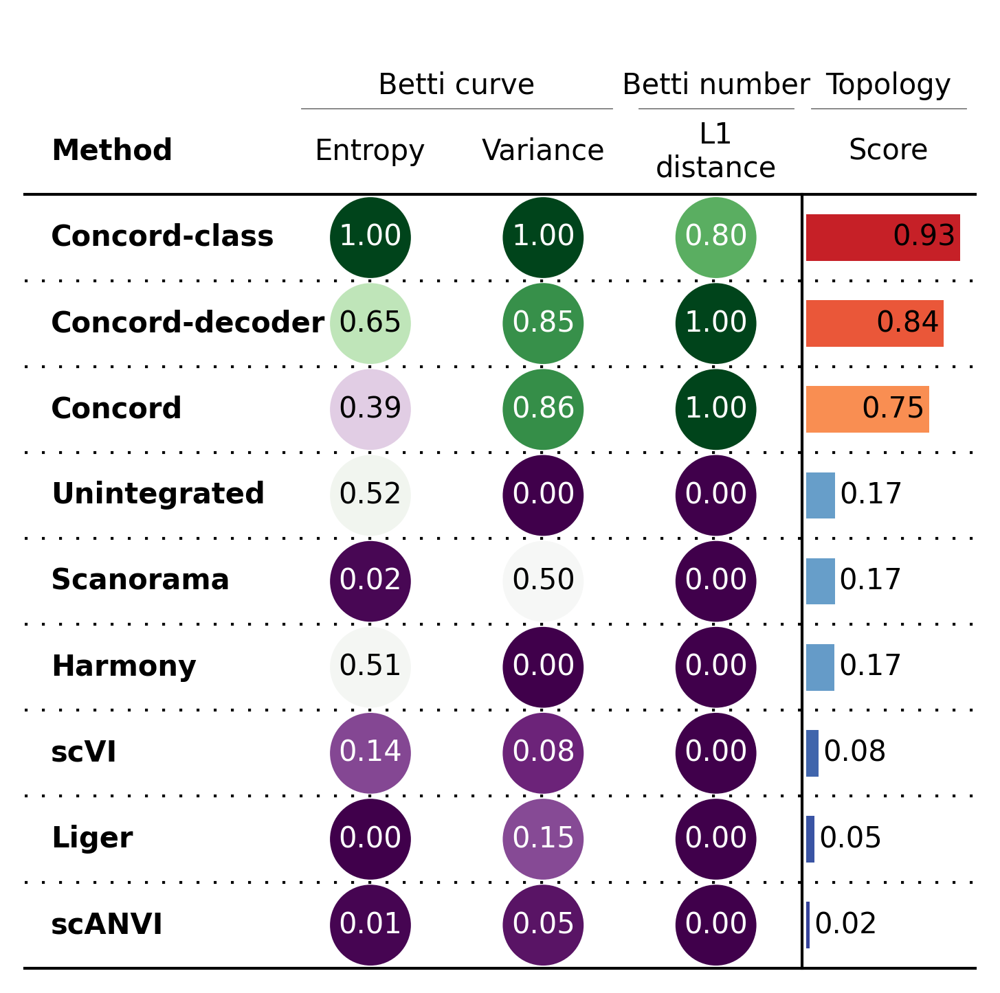

In [88]:
topology_results = ccd.ul.benchmark_topology(diagrams, expected_betti_numbers=[0,1,0], save_dir=save_dir, file_suffix=file_suffix)
max_betti = 5
topology_metrics = topology_results['combined_metrics'].drop(index=['PCA_no_noise', 'PCA_wt_noise'])
topology_metrics[('Betti number', 'L1 distance')] = topology_metrics[('Betti number', 'L1 distance')].clip(upper=5)
agg_name1 = 'Topology'
agg_name2 = 'Score'
topology_scores = ccd.ul.benchmark_stats_to_score(topology_metrics, min_max_scale=True, one_minus=True, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2), name_exact=False)
ccd.pl.plot_benchmark_table(topology_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"topology_results_{file_suffix}.pdf", figsize=(6, 6), dpi=300)

In [87]:
topology_results['distance_metrics']

,L1 Distance,L2 Distance,Total Relative Error,Observed Betti Numbers,Expected Betti Numbers
Method,,,,,
PCA_no_noise,1,1.000000,1.0,"0, 0, 0","1, 0, 0"
PCA_wt_noise,798,798.000000,798.0,"799, 0, 0","1, 0, 0"
Unintegrated,798,798.000000,798.0,"799, 0, 0","1, 0, 0"
Scanorama,798,798.000000,798.0,"799, 0, 0","1, 0, 0"
Liger,798,798.000000,798.0,"799, 0, 0","1, 0, 0"
Harmony,798,798.000000,798.0,"799, 0, 0","1, 0, 0"
scVI,798,798.000000,798.0,"799, 0, 0","1, 0, 0"
scANVI,798,798.000000,798.0,"799, 0, 0","1, 0, 0"
Concord,2,1.414214,1.0,"0, 1, 0","1, 0, 0"


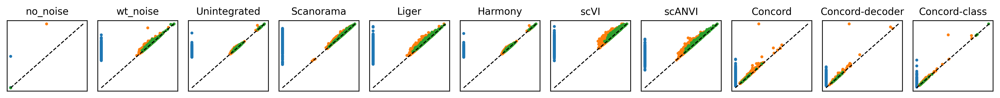

In [89]:
# Reorder diagrams with the same order as the combined keys
diagrams_ordered = {key: diagrams[key] for key in combined_keys}
# Change the key names to remove 'PCA_'
diagrams_ordered = {key.replace('PCA_', ''): diagrams_ordered[key] for key in diagrams_ordered}
ccd.pl.plot_persistence_diagrams(diagrams_ordered, base_size=(1.3, 1.5), dpi=300, marker_size=4, n_cols=11, fontsize=10, save_path=save_dir / f"persistence_diagrams_{file_suffix}.pdf", legend=False, label_axes=False, axis_ticks=False)

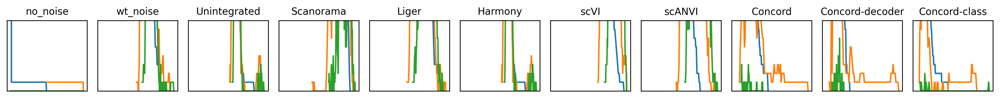

In [90]:
ccd.pl.plot_betti_curves(diagrams_ordered, nbins=100, base_size=(1.3, 1.5), n_cols=11, fontsize=10, save_path=save_dir / f"betti_curves_{file_suffix}.pdf", dpi=300, legend=False, label_axes=False, axis_ticks=False)

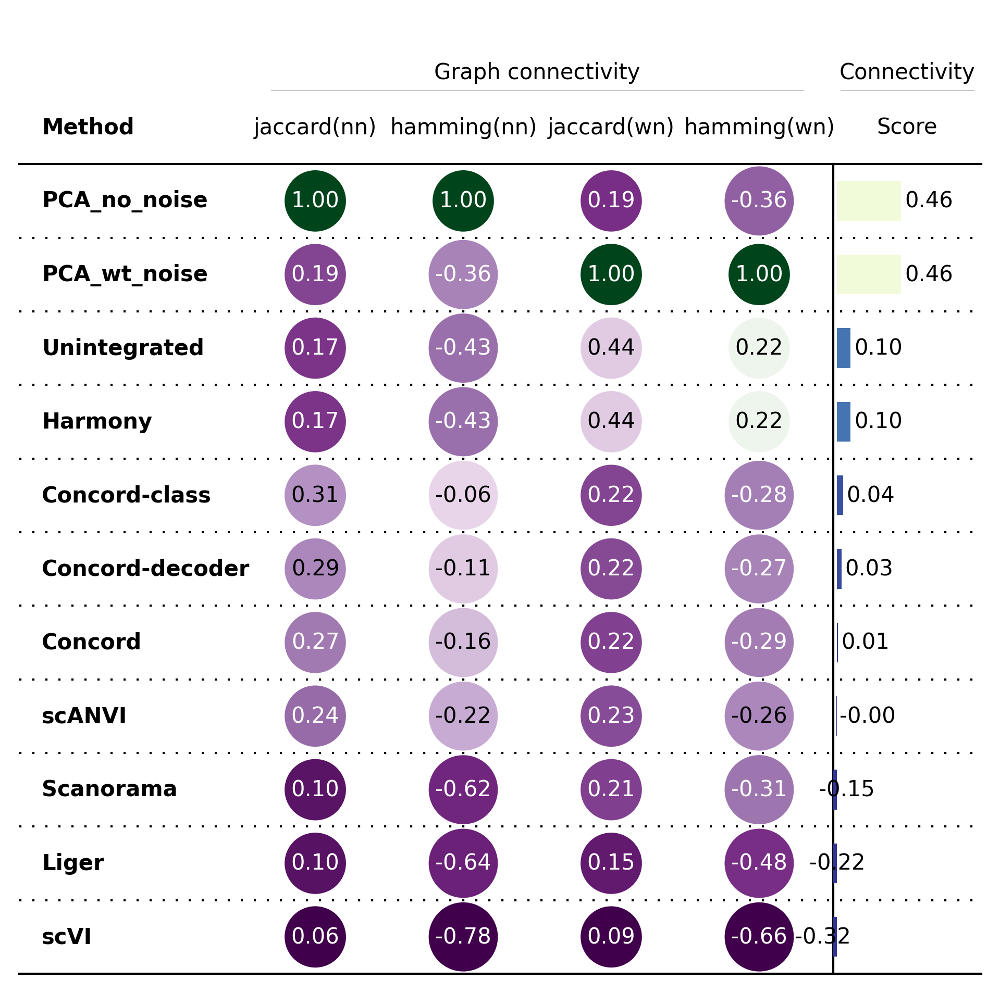

In [91]:
# compare connectivity for latent vs ground truth, store the result in a pandas dataframe
groundtruth_keys = {'(nn)': 'PCA_no_noise','(wn)': 'PCA_wt_noise'}
connectivity_df = ccd.ul.benchmark_graph_connectivity(adata, emb_keys=combined_keys, groundtruth_keys=groundtruth_keys, k=30)
agg_name1 = 'Connectivity'
agg_name2 = 'Score'
connectivity_scores = ccd.ul.benchmark_stats_to_score(connectivity_df, min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2), name_exact=False)
ccd.pl.plot_benchmark_table(connectivity_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"connectivity_results_{file_suffix}.pdf", figsize=(8, 8), dpi=300)


# Geomtric Features 

### Integrated benchmark pipeline

In [92]:
latent_keys = ["Unintegrated", "Scanorama", "Liger", "Harmony", "scVI", "scANVI", "Concord", 'Concord-decoder', "Concord-class"]
ground_keys = ['PCA_no_noise', 'PCA_wt_noise']
combined_keys = ground_keys + latent_keys 

In [98]:
geometry_metrics = ['cell_distance_corr', 'local_distal_corr', 'trustworthiness', 'state_distance_corr', 'state_dispersion_corr', 'state_batch_distance_ratio']
dist_metric = 'cosine'
corr_types = ['pearsonr', 'spearmanr', 'kendalltau']
groundtruth_key = 'PCA_wt_noise'
#groundtruth_key = 'PCA_no_noise'
# Convert state_dispersion to a dict of groundtruth dispersion
#groundtruth_dispersion = {'cluster_' + str(i): state_dispersion[i]**2 for i in range(5)} # convert to variance
geometry_df, geometry_full = ccd.ul.benchmark_geometry(adata, keys=combined_keys, eval_metrics=geometry_metrics, 
                                      dist_metric=dist_metric,
                                      corr_types = corr_types,
                                      groundtruth_key = groundtruth_key,
                                      state_key = leiden_key,
                                      batch_key = batch_key,
                                      #groundtruth_dispersion = groundtruth_dispersion,
                                      dispersion_metric='var',
                                      return_type='full',
                                      start_point=0,
                                      end_point=adata.n_obs-1,
                                      pseudotime_k = 30,
                                      truetime_key = 'time',
                                      save_dir=save_dir, 
                                      file_suffix=file_suffix)

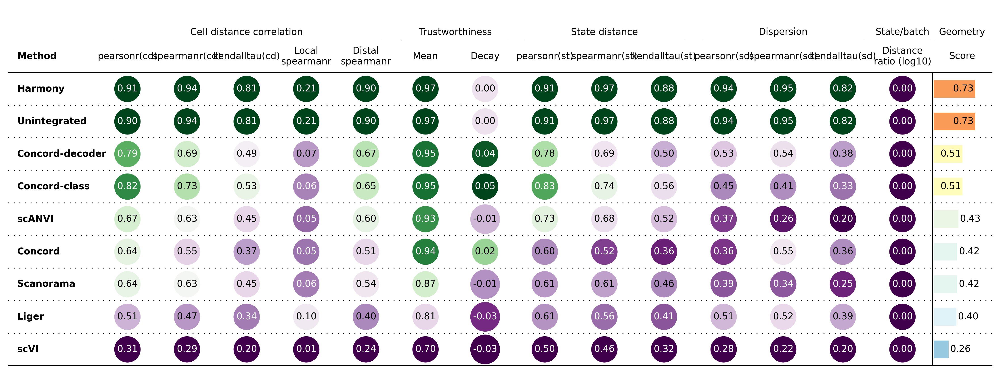

In [99]:
agg_name1 = 'Geometry'
agg_name2 = 'Score'
geometry_scores = ccd.ul.benchmark_stats_to_score(
    geometry_df.drop(index=['PCA_no_noise', 'PCA_wt_noise']), fillna = 0,               
    min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2))
ccd.pl.plot_benchmark_table(geometry_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"geometry_results_noscale_{dist_metric}_{groundtruth_key}_{file_suffix}.pdf", figsize=(19, 7), dpi=300)

In [100]:
geometry_full['Pseudotime']['pseudotime'].keys()

KeyError: 'Pseudotime'

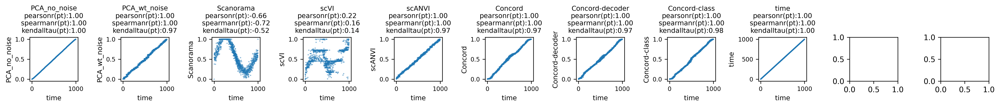

In [30]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['Pseudotime']['pseudotime'], 
    correlation= geometry_full['Pseudotime']['correlation'],
    s=3,
    ground_key = 'time', fontsize=9,
    n_cols = 11, figsize=(1.7,2.1), dpi=300, save_path=save_dir / f"pseudotime_scatter_{groundtruth_key}_{file_suffix}.pdf")

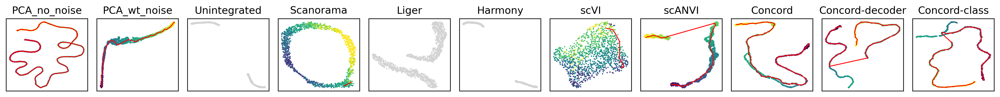

In [32]:
import matplotlib.pyplot as plt

n_cols = 11
n_rows = int(np.ceil(len(combined_keys) / n_cols))
base_size = (1.5, 1.7)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*base_size[0], n_rows*base_size[1]), dpi=300)

axes = np.atleast_2d(axes).flatten()
for basis in combined_keys:
    show_basis = basis + '_UMAP'
    if show_basis not in adata.obsm or basis not in geometry_full['Pseudotime']['pseudotime']:
        show_indices = None
        adata.obs['pseudotime_plot'] = np.nan
    else:
        show_indices = geometry_full['Pseudotime']['path'][basis]
        adata.obs['pseudotime_plot'] = geometry_full['Pseudotime']['pseudotime'][basis]
    
    show_cols = ['pseudotime_plot']

    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, highlight_indices=show_indices, highlight_size=5, draw_path=True, alpha=1.0,
        font_size=12, point_size=10, path_width=1,
        legend_loc='on data', title=basis, colorbar_loc=None, rasterized=True, xlabel=None, ylabel=None, 
        ax=axes[combined_keys.index(basis)]
    )

plt.tight_layout()
plt.savefig(save_dir / f"pseudotime_embedding_{file_suffix}.pdf")

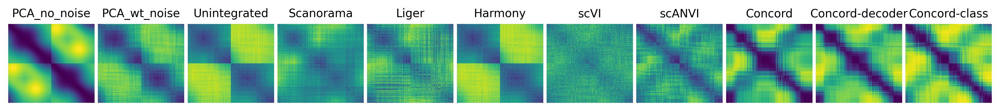

In [ ]:
ccd.pl.plot_distance_heatmap(geometry_full['cell_distance_corr']['distance'], n_cols = 11, figsize=(1.1,1.3), cbar=False, dpi=300, save_path=save_dir / f"cell_distance_hmap_{file_suffix}.svg")

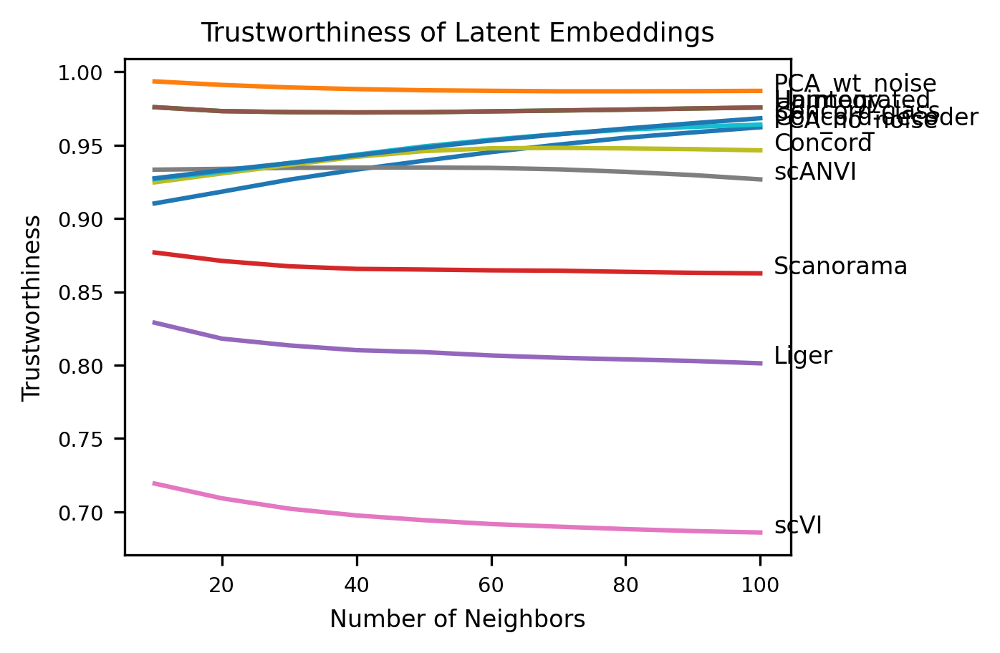

In [101]:
trustworthiness_scores = geometry_full['trustworthiness']['scores']
ccd.pl.plot_trustworthiness(trustworthiness_scores, text_shift=2, legend=False, save_path=save_dir / f"trustworthiness_{groundtruth_key}_{file_suffix}.pdf", figsize=(4,3))

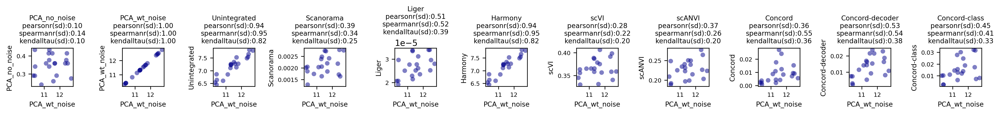

In [102]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['state_dispersion_corr']['dispersion'], 
    correlation= geometry_full['state_dispersion_corr']['correlation'],
    s=30, c='darkblue',
    ground_key = groundtruth_key,
    n_cols = 11, figsize=(1.5,2.0), dpi=300, save_path=save_dir / f"state_dispersion_scatter_{groundtruth_key}_{file_suffix}.pdf")

### 2.0 Decoder reconstruction

In [92]:
adata.layers

Layers with keys: wt_noise, counts, Scanorama_corrected, Liger_corrected, scVI_corrected_batch_1, scANVI_corrected_batch_1, X_normed, X_log1p, Concord-decoder_decoded_batch_1, Concord-decoder_decoded_batch_2, no_noise

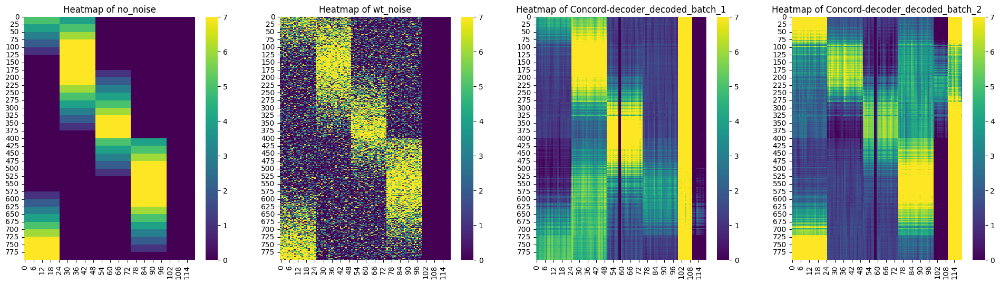

In [103]:
# Align and copy the layer data based on observation names
adata.layers['no_noise'] = np.zeros_like(adata.X)

# Find the indices of common genes between `adata` and `adata_state`
common_genes = adata.var_names.intersection(adata_state.var_names)
adata_indices = adata.var_names.get_indexer(common_genes)
adata_state_indices = adata_state.var_names.get_indexer(common_genes)

# Copy data from `adata_state` to `adata` for these common genes
adata.layers['no_noise'][:, adata_indices] = adata_state.layers['no_noise'][:, adata_state_indices].copy()

decoded_layers = ['Concord-decoder_decoded_batch_1', 'Concord-decoder_decoded_batch_2']
show_layers = ['no_noise', 'wt_noise'] + decoded_layers
ccd.pl.plot_adata_layer_heatmaps(adata, ncells=None, ngenes=None, layers=show_layers, cmap='viridis', vmin=0, vmax=7, 
                                 obs_keys=[state_key, batch_key], transpose=False, figsize=(6,6),  dpi=300, save_path=save_dir/f'decoded_heatmap_{file_suffix}.png')

In [104]:
# Compute the reconstruction error between the original and reconstructed data
mse_no_noise = np.zeros(len(decoded_layers))
mse_wt_noise = np.zeros(len(decoded_layers))
state_genes = adata.var_names[adata.var_names.isin(adata_state.var_names)]
for layer in decoded_layers:
    mse_no_noise[decoded_layers.index(layer)] = ccd.ul.compute_reconstruction_error(adata[:,state_genes], 'no_noise', layer, metric='mse')
    mse_wt_noise[decoded_layers.index(layer)] = ccd.ul.compute_reconstruction_error(adata[:,state_genes], 'wt_noise', layer, metric='mse')

# Report value, mean
print(f"MSE between no_noise and decoded layers: {mse_no_noise}")
print(f"MSE between wt_noise and decoded layers: {mse_wt_noise}")
print(f"Mean MSE between no_noise and decoded layers: {np.mean(mse_no_noise):.4f}")
print(f"Mean MSE between wt_noise and decoded layers: {np.mean(mse_wt_noise):.4f}")


MSE between no_noise and decoded layers: [6.09363078 4.51247027]
MSE between wt_noise and decoded layers: [11.93992894 10.4031683 ]
Mean MSE between no_noise and decoded layers: 5.3031
Mean MSE between wt_noise and decoded layers: 11.1715
